<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction-and-problem-overview" data-toc-modified-id="Introduction-and-problem-overview-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction and problem overview</a></span></li><li><span><a href="#Getting-all-voxel-sizes-and-image-shapes" data-toc-modified-id="Getting-all-voxel-sizes-and-image-shapes-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Getting all voxel sizes and image shapes</a></span></li><li><span><a href="#Inspection-of-non-isotropic-MRI" data-toc-modified-id="Inspection-of-non-isotropic-MRI-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Inspection of non-isotropic MRI</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

# MRI Profile Selection - voxel and size inspection
*******************

**<div itemscope itemtype="https://schema.org/Person"><a itemprop="sameAs" content="https://orcid.org/0000-0001-5567-801X" href="https://orcid.org/0000-0001-5567-801X" target="orcid.widget" rel="me noopener noreferrer" style="vertical-align:top;"><img src="https://orcid.org/sites/default/files/images/orcid_16x16.png" style="width:1em;margin-left:0em;"  alt="ORCID iD icon">Adrián Arnaiz-Rodríguez</a></div>**


## Introduction and problem overview
**We have to select which profile of 3D MRI we will use in order to get 2D slices**

For **non-isotropic acquisitions**, we should ideally slice them so that the slices are high resolution. For example, if the voxel resolution is **1x1x5 mm<sup>3</sup>**, we should slice the volume so that the **slices are 1x1mm<sup>2</sup>** rather than 1x5mm<sup>2</sup> (or 5x1mm<sup>2</sup>).

Overriding the above, we need to be consistent in which **orientation** we are slicing. In other words, if we are getting axial slices from one volume, we should make sure we get axial slices for **all patients**. Otherwise, the network will likely not train well.


**We will extract and tabulate the voxel resolution for each scan**.

*********
**SPOILER**

* **0.9375x0.9375x1.2 mm<sup>3</sup>** $\rightarrow$ **576 volumes**
* **0.9766x0.9766x1.2 mm<sup>3</sup>** $\rightarrow$ **5 volumes**
* **We should fix the 3rd dimension of the brain MRI in order to get the 2D slices.**
* **We will get 2D slices of shape 256x256 wit voxel sizes 0.9375x0.9375 mm<sup>2</sup> for 576 volumes and 0.9766x0.9766 mm<sup>2</sup> for 5 volumes**.
*********

**For better understanding of brain MR volume profile: see seconds 36-43 of following video**:

In [1]:
from IPython.display import IFrame
IFrame('https://www.youtube.com/embed/2J8bDkALBic?start=36', width=600, height=350)

In [2]:
import nibabel as nib
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import collections as col

import matplotlib.animation as animation
from IPython.display import HTML

In [3]:
files = glob.glob('../IXI-T1/*.gz')
len(files), files[0]

(581, '../IXI-T1\\IXI002-Guys-0828-T1.nii.gz')

## Getting all voxel sizes and image shapes

In [4]:
all_vol_shapes = []
all_voxel_sizes = []

for file in files:
    act_vol = nib.load(file)
    sh = act_vol.get_fdata().shape
    vx_size = act_vol.header.get_zooms()
    
    all_vol_shapes.append(sh)
    all_voxel_sizes.append(vx_size)
    
all_vol_shapes = np.array(all_vol_shapes)   
all_voxel_sizes = np.array(all_voxel_sizes)
    

## Inspection of non-isotropic MRI


In [5]:
col.Counter(all_voxel_sizes[:,0].round(4)), col.Counter(all_voxel_sizes[:,1].round(4)), col.Counter(all_voxel_sizes[:,2].round(4))

(Counter({0.9375: 576, 0.9766: 5}),
 Counter({0.9375: 576, 0.9766: 5}),
 Counter({1.2: 581}))

In [6]:
np.all(all_voxel_sizes[:,0].round(4)==all_voxel_sizes[:,1].round(4))

True

In [7]:
df_voxel = pd.DataFrame(all_voxel_sizes.round(4))
df_voxel['isotropic'] = df_voxel[0]==df_voxel[1]
df_voxel.sample(6)

,0,1,2,isotropic
441,0.9375,0.9375,1.2,True
562,0.9375,0.9375,1.2,True
402,0.9375,0.9375,1.2,True
470,0.9375,0.9375,1.2,True
129,0.9375,0.9375,1.2,True
419,0.9375,0.9375,1.2,True


In [8]:
df_voxel.value_counts()

0       1       2    isotropic
0.9375  0.9375  1.2  True         576
0.9766  0.9766  1.2  True           5
dtype: int64

## Conclusion

**We should fix the 3rd dimension of the brain MRI in order to get the 2D slices.**

**We will get 2D slices of shape 256x256 wit voxel sizes 0.9375x0.9375 mm<sup>2</sup> for 576 volumes and 0.9766x0.9766x1.2 mm<sup>3</sup> for 5 volumes**.

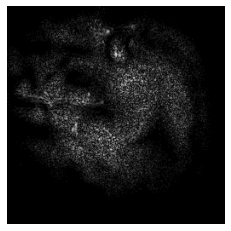

In [9]:
def show_animation(train=True):
    images = nib.load(files[132]).get_fdata()
    images = np.moveaxis(images, 2,0)
    fig = plt.figure()
    ims = list()
    for idx, image in enumerate(images):
        img = plt.imshow(image,cmap='gray',animated=True)
        plt.axis('off')
        ims.append([img])
    ani = animation.ArtistAnimation(fig,ims,interval=100,blit=False,repeat_delay=1000)
    return ani

ani = show_animation();

In [10]:
HTML(ani.to_jshtml())

*Adrián Arnaiz*